# LPCMCI + ParCorr — Latent-Confounder-Robust Causal Discovery

`pcmci_parcorr.ipynb`, `pcmci_gpdc.ipynb`, and `pcmci_cmi.ipynb` all assume **causal sufficiency**:
that every common driver of two measured variables is itself in the dataset. That assumption is
almost certainly false here — global risk sentiment, unlisted commodity fundamentals, and other
unmodeled macro shocks can drive both a "cause" and an "effect" column simultaneously. When that
happens, PCMCI reports a directed edge that is actually spurious.

**LPCMCI** (Latent-PCMCI, Gerhardus & Runge 2020) drops the causal-sufficiency assumption. Instead of
a DAG, it learns a **time series DPAG** (directed partial ancestral graph) with edge types that
distinguish genuine causes from confounded correlations:

| Symbol | Meaning |
|--------|---------|
| `X --> Y` | `X` is a (possibly indirect) cause of `Y`, and `Y` does not cause `X` |
| `X <-> Y` | Neither causes the other — both driven by an **unobserved common cause** |
| `X o-> Y` | `Y` does not cause `X`, but whether `X -> Y` or `X <-> Y` is undetermined |
| `X o-o Y` | Fully undetermined |

This is one of three sibling notebooks — `lpcmci_parcorr.ipynb`, `lpcmci_gpdc.ipynb`,
`lpcmci_cmi.ipynb` — mirroring `pcmci_parcorr.ipynb` / `pcmci_gpdc.ipynb` / `pcmci_cmi.ipynb` one
for one, but running LPCMCI instead of plain PCMCI. This one pairs LPCMCI with **ParCorr** (linear,
analytic), the same CI test `pcmci_parcorr.ipynb` uses, so the only thing that changes relative to
that notebook is the algorithm's confounder-awareness.

Preprocessing identical to `eda_preprocessing.ipynb`: interpolate -> ffill -> Gaussian detrend (15-yr)
-> anomalize -> `pp.trafo2normal`.

**Reference:** Gerhardus, A. and Runge, J. (2020). High-recall causal discovery for autocorrelated
time series with latent confounders. *NeurIPS 33*, 12615-12625.
[Tutorial](../tutorials/causal_discovery/tigramite_tutorial_latent-pcmci.ipynb) followed for API usage,
`tau_max` selection via `run_bivci`, and the runtime-bound arguments.

## Imports & Configuration

In [1]:
import sys
from pathlib import Path
import time

ROOT = Path('.').resolve().parent
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tigramite import data_processing as pp
from tigramite import plotting as tp
from tigramite.pcmci import PCMCI
from tigramite.lpcmci import LPCMCI
from tigramite.independence_tests.parcorr import ParCorr

plt.rcParams.update({
    'figure.dpi': 120,
    'font.size': 11,
    'axes.titlesize': 12,
    'axes.labelsize': 11,
    'legend.fontsize': 10,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

# ── Configuration ─────────────────────────────────────────────────────────────
CROPS     = ['corn', 'soybean', 'wheat']
FREQUENCY = 'monthly'

CYCLE_LEN    = 12
SMOOTH_WIDTH = 15 * CYCLE_LEN

METHOD_LABEL     = 'ParCorr'
TAU_MAX          = 3      # LPCMCI's own tau_max — matches pcmci_parcorr.ipynb
BASELINE_TAU_MAX = 3      # tau_max used for the PCMCI+ParCorr comparison in Section 9

# LPCMCI-specific parameters — see the Runtime Tuning section for why pc_alpha and the
# runtime bounds differ from pcmci_parcorr.ipynb's pc_alpha=0.2.
PC_ALPHA                 = 0.01   # tutorial default; a tight skeleton is required for tractability
N_PRELIMINARY_ITERATIONS = 1      # k in the algorithm — improves finite-sample power (tutorial S2.4/S3.7)
MAX_P_GLOBAL             = 2      # caps |S| in the ancestral phase
MAX_P_NON_ANCESTRAL      = 1      # caps |S| in the (expensive) non-ancestral phase — dominant runtime control
MAX_COND_PX              = 0      # tigramite default
MAX_Q_GLOBAL             = 2      # caps number of conditioning sets tested per link

ALPHA_LEVEL = 0.05
FDR_METHOD  = 'fdr_bh'

print(f'Crops     : {CROPS}')
print(f'Frequency : {FREQUENCY}')
print(f'tau_max   : {TAU_MAX}')
print(f'pc_alpha  : {PC_ALPHA}')
print(f'n_preliminary_iterations : {N_PRELIMINARY_ITERATIONS}')
print(f'max_p_global / max_p_non_ancestral / max_q_global : '
      f'{MAX_P_GLOBAL} / {MAX_P_NON_ANCESTRAL} / {MAX_Q_GLOBAL}')

Crops     : ['corn', 'soybean', 'wheat']
Frequency : monthly
tau_max   : 3
pc_alpha  : 0.01
n_preliminary_iterations : 1
max_p_global / max_p_non_ancestral / max_q_global : 2 / 1 / 2


## Feature Group Definitions

In [2]:
FEATURE_GROUPS = {
    'rv'     : ['weekly_rv'],
    'climate': ['prcp', 'awnd', 'tmin', 'tmax', 'co2', 'pdsi',
                'EVAP', 'soil_moisture_mean_m3m3', 'cloud_cover_mean_pct', 'humidity_mean_pct',
                'ssta_elino', 'ssta_lanina', 'SOI_index', 'NAO_index'],
    'macro'  : ['DJIA_Index', 'WTI_Index', 'Broad_Dollar_index', 'Stock_Uncertainty'],
    'news'   : ['frbsf_sentiment', 'epu_index', 'Text_Climate_Anomaly'],
}

GROUP_COLORS = {
    'rv': '#e41a1c', 'climate': '#377eb8', 'macro': '#4daf4a', 'news': '#984ea3',
}

FEATURE_SETS = {
    'climate'              : ['climate'],
    'climate_rv'           : ['climate', 'rv'],
    'macro_climate_rv'     : ['macro', 'climate', 'rv'],
    'macro_news_climate_rv': ['macro', 'news', 'climate', 'rv'],
}

def build_cols(groups: list[str]) -> list[str]:
    cols: list[str] = []
    for g in groups:
        cols.extend(FEATURE_GROUPS[g])
    return cols

def group_of(col: str) -> str:
    for g, cols in FEATURE_GROUPS.items():
        if col in cols:
            return g
    return 'other'

for name, groups in FEATURE_SETS.items():
    print(f'{name:30s}: {len(build_cols(groups)):2d} vars')

climate                       : 14 vars
climate_rv                    : 15 vars
macro_climate_rv              : 19 vars
macro_news_climate_rv         : 22 vars


## Preprocessing Pipeline

Identical to `eda_preprocessing.ipynb` and every other `pcmci_*.ipynb` / `lpcmci_*.ipynb` notebook in
this project, so results stay comparable across notebooks.

| Step | Method | Why |
|------|--------|-----|
| Impute | Interpolate `pdsi`/`Broad_Dollar_index`, ffill `DJIA_Index` | Fill isolated gaps before detrending |
| Detrend | `pp.smooth(residuals=True, kernel='gaussian', smooth_width=15yr)` | Removes secular drift that would inflate long-range spurious links |
| Anomalize | Subtract phase mean, divide by phase std | Removes annual seasonality |
| Gaussianise | `pp.trafo2normal` | Marginal Gaussianity validates ParCorr's analytic t-test used inside LPCMCI (and inside `run_bivci`'s `tau_max` scan) |

In [3]:
def load_and_preprocess(crop: str, frequency: str) -> tuple[np.ndarray, list[str], pd.Series]:
    """Load CSV, impute, detrend, anomalize, Gaussianise. Returns (arr_normal, col_names, dates)."""
    path = ROOT / 'data' / frequency / f'{crop}.csv'
    raw  = pd.read_csv(path, parse_dates=['date'])
    df   = raw.sort_values('date').reset_index(drop=True)

    for col in ['pdsi', 'Broad_Dollar_index']:
        if col in df.columns:
            df[col] = df[col].interpolate(method='linear', limit_direction='both')
    for col in ['DJIA_Index']:
        if col in df.columns:
            df[col] = df[col].ffill().bfill()
    df = df.dropna().reset_index(drop=True)

    col_names = [c for c in df.columns if c != 'date']
    arr = df[col_names].values.astype(float)

    cycle_len    = 52 if frequency == 'weekly' else 12
    smooth_width = 15 * cycle_len
    arr_detrended = pp.smooth(arr, smooth_width=smooth_width, kernel='gaussian', residuals=True)

    arr_anom = arr_detrended.copy().astype(float)
    for phase in range(cycle_len):
        idx = slice(phase, None, cycle_len)
        arr_anom[idx] -= arr_detrended[idx].mean(axis=0)
        std = arr_detrended[idx].std(axis=0)
        std[std == 0] = 1.0
        arr_anom[idx] /= std

    arr_normal = pp.trafo2normal(arr_anom)
    return arr_normal, col_names, df['date']


print('Preprocessing function defined.')

Preprocessing function defined.


## Preprocessed Data Overview

All plots below use data after the full pipeline (impute -> detrend -> anomalize -> Gaussianise).

- **Time series** — all 22 variables for corn (representative crop) after preprocessing
- **Cross-correlations** — CCF of each variable X at lags 0..3 against `weekly_rv`, shown for all three crops simultaneously

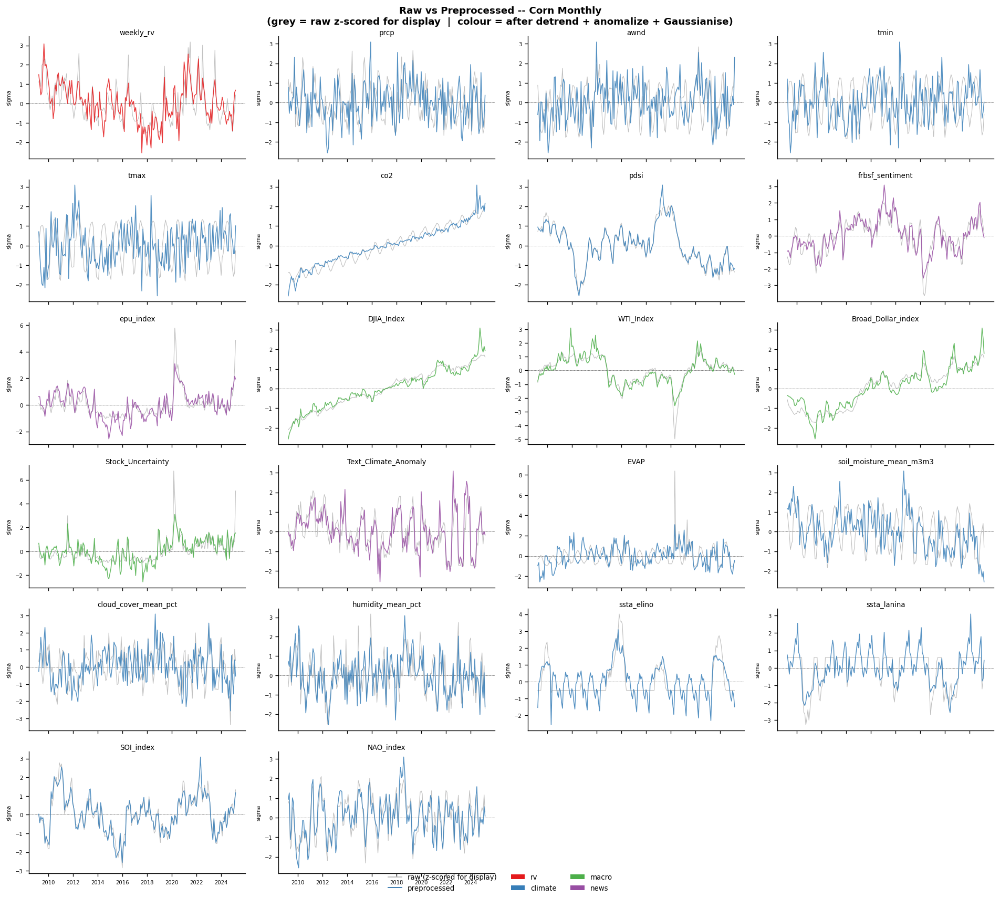

In [4]:
from matplotlib.patches import Patch as _Patch
from matplotlib.lines import Line2D as _Line2D

_raw_df    = pd.read_csv(ROOT / 'data' / FREQUENCY / 'corn.csv', parse_dates=['date'])
_raw_cols  = [c for c in _raw_df.columns if c != 'date']
_raw_arr   = _raw_df[_raw_cols].values.astype(float)
_raw_dates = _raw_df['date']

_arr0, _cols0, _dates0 = load_and_preprocess('corn', FREQUENCY)
_N   = len(_cols0)
_ncg = 4
_nrg = (_N + _ncg - 1) // _ncg

fig, axes = plt.subplots(_nrg, _ncg, figsize=(_ncg * 4, _nrg * 2.4), sharex=True)
axes = axes.flatten()
for i, col in enumerate(_cols0):
    ax = axes[i]
    color = GROUP_COLORS.get(group_of(col), '#888')
    if col in _raw_cols:
        _r     = _raw_arr[:, _raw_cols.index(col)].astype(float)
        _r_std = _r.std()
        _r_z   = (_r - _r.mean()) / (_r_std if _r_std > 0 else 1.0)
        ax.plot(_raw_dates, _r_z, lw=0.7, color='#bbbbbb', alpha=0.9, zorder=1)
    ax.plot(_dates0, _arr0[:, i], lw=0.9, color=color, alpha=0.85, zorder=2)
    ax.axhline(0, color='k', lw=0.3, ls='--', zorder=0)
    ax.set_title(col, fontsize=8, pad=2)
    ax.tick_params(labelsize=6)
    ax.set_ylabel('sigma', fontsize=6)
    for sp in ['top', 'right']:
        ax.spines[sp].set_visible(False)
for ax in axes[_N:]:
    ax.set_visible(False)
_leg = [_Line2D([0],[0], color='#bbbbbb', lw=1.2, label='raw (z-scored for display)'),
        _Line2D([0],[0], color='steelblue', lw=1.2, label='preprocessed')]
_leg += [_Patch(facecolor=c, label=g) for g, c in GROUP_COLORS.items()]
fig.legend(handles=_leg, loc='lower center', ncol=3, fontsize=8, frameon=False)
fig.suptitle(
    f'Raw vs Preprocessed -- Corn {FREQUENCY.capitalize()}\n'
    '(grey = raw z-scored for display  |  colour = after detrend + anomalize + Gaussianise)',
    fontsize=11, fontweight='bold',
)
plt.tight_layout()
plt.show()

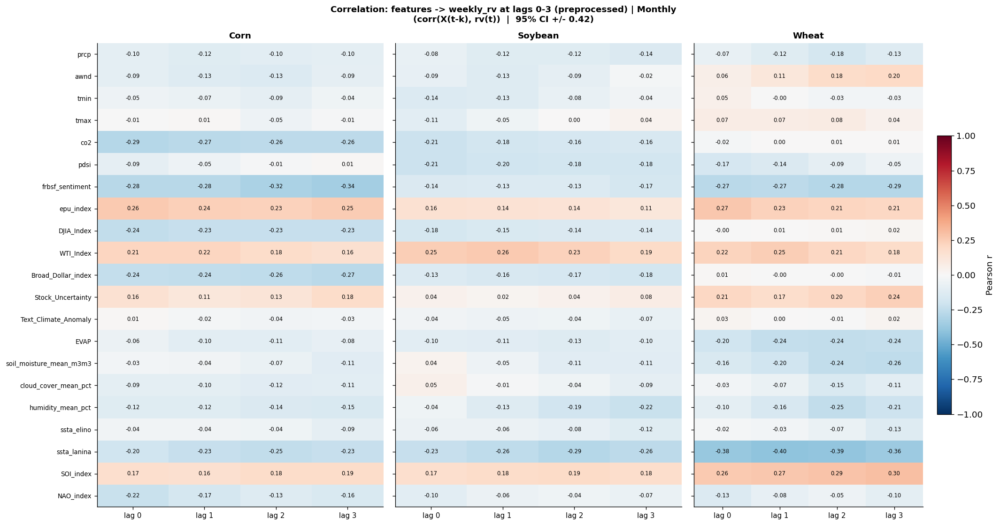

In [5]:
_preproc = {}
for _crop in CROPS:
    _a, _c, _d = load_and_preprocess(_crop, FREQUENCY)
    _preproc[_crop] = (_a, _c, _d)

_LAGS  = [0, 1, 2, 3]
_other = [c for c in _cols0 if c != 'weekly_rv']
_n_oth = len(_other)
_ci    = 1.96 / np.sqrt(_N)

fig, axes = plt.subplots(1, 3, figsize=(18, max(7, _n_oth * 0.38 + 1.5)), sharey=True)

for ax, crop in zip(axes, CROPS):
    arr, cols, _ = _preproc[crop]
    if 'weekly_rv' not in cols:
        continue
    rv = arr[:, cols.index('weekly_rv')]

    corr_mat = np.full((_n_oth, len(_LAGS)), np.nan)
    for li, lag in enumerate(_LAGS):
        for fi, feat in enumerate(_other):
            if feat not in cols:
                continue
            x = arr[:, cols.index(feat)]
            corr_mat[fi, li] = np.corrcoef(x[: len(x) - lag] if lag else x,
                                            rv[lag:] if lag else rv)[0, 1]

    im = ax.imshow(corr_mat, cmap='RdBu_r', vmin=-1, vmax=1, aspect='auto')
    ax.set_xticks(range(len(_LAGS)))
    ax.set_xticklabels([f'lag {l}' for l in _LAGS], fontsize=9)
    ax.set_yticks(range(_n_oth))
    ax.set_yticklabels(_other, fontsize=8)

    for fi in range(_n_oth):
        for li in range(len(_LAGS)):
            val = corr_mat[fi, li]
            if not np.isnan(val):
                ax.text(li, fi, f'{val:.2f}', ha='center', va='center',
                        fontsize=7, color='white' if abs(val) > 0.5 else 'black')

    ax.set_title(crop.capitalize(), fontsize=11, fontweight='bold')

plt.colorbar(im, ax=axes[-1], shrink=0.6, label='Pearson r')
fig.suptitle(
    f'Correlation: features -> weekly_rv at lags 0-3 (preprocessed) | {FREQUENCY.capitalize()}\n'
    f'(corr(X(t-k), rv(t))  |  95% CI +/- {_ci:.2f})',
    fontsize=11, fontweight='bold',
)
plt.tight_layout()
plt.show()

## Choosing `tau_max` — Bivariate Lagged CI (tutorial S3.3)

The LPCMCI tutorial recommends running `PCMCI.run_bivci` first — a bivariate lag-function scan,
similar to Granger causality but lag-specific — to check `tau_max` is large enough to capture the
decay of dependence. `run_bivci` always uses ParCorr internally (it is a cheap linear pre-check,
independent of which CI test LPCMCI itself will use below).

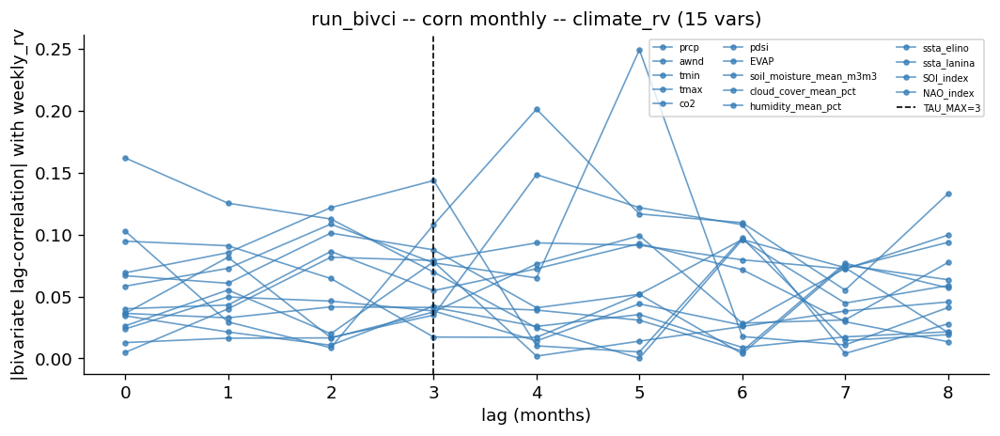

In [6]:
_arr_bv, _cols_bv, _dates_bv = load_and_preprocess('corn', FREQUENCY)
_bv_cols = [c for c in build_cols(FEATURE_SETS['climate_rv']) if c in _cols_bv]
_bv_idx  = [_cols_bv.index(c) for c in _bv_cols]
_arr_bv_sub = _arr_bv[:, _bv_idx]

_dataframe_bv = pp.DataFrame(_arr_bv_sub, var_names=_bv_cols, datatime={0: np.arange(len(_arr_bv_sub))})
_parcorr_bv   = ParCorr(significance='analytic')
_pcmci_bv     = PCMCI(dataframe=_dataframe_bv, cond_ind_test=_parcorr_bv, verbosity=0)

_biv_val = _pcmci_bv.run_bivci(tau_max=8, val_only=True)['val_matrix']
_rv_idx  = _bv_cols.index('weekly_rv')

fig, ax = plt.subplots(figsize=(9, 4))
_lags = np.arange(9)
for i, c in enumerate(_bv_cols):
    if c == 'weekly_rv':
        continue
    ax.plot(_lags, np.abs(_biv_val[i, _rv_idx, :]), marker='o', ms=3, lw=1,
             color=GROUP_COLORS.get(group_of(c), '#888'), alpha=0.75, label=c)
ax.axvline(TAU_MAX, color='k', ls='--', lw=1, label=f'TAU_MAX={TAU_MAX}')
ax.set_xlabel('lag (months)')
ax.set_ylabel('|bivariate lag-correlation| with weekly_rv')
ax.set_title(f'run_bivci -- corn {FREQUENCY} -- climate_rv ({len(_bv_cols)} vars)')
ax.legend(fontsize=6, ncol=3, loc='upper right')
plt.tight_layout()
plt.show()

## LPCMCI + ParCorr Helper Functions

In [7]:
EDGE_INFO = {
    '-->': ('directed',            'candidate cause (i -> j); may still be confounded unless "visible"'),
    '<->': ('confounded',          'no causal link either way -- both driven by an unobserved common cause'),
    'o->': ('uncertain-directed',  'j does not cause i; whether i -> j or i <-> j is undetermined'),
    'x->': ('conflicting-directed','orientation rules disagree on whether i -> j or i <-> j'),
    'o-o': ('uncertain',           'fully undetermined: could be i -> j, j -> i, or i <-> j'),
    'x-x': ('conflicting',         'orientation rules disagree even on the direction of causal flow'),
}

CATEGORY_STYLE = {
    'directed':             dict(color='#2b8a3e', dashes=False, arrow_both=False, label='directed (candidate cause)'),
    'confounded':           dict(color='#c92a2a', dashes=True,  arrow_both=True,  label='confounded (latent common cause)'),
    'uncertain-directed':   dict(color='#e8590c', dashes=True,  arrow_both=False, label='uncertain, not reverse-causal'),
    'uncertain':            dict(color='#868e96', dashes=True,  arrow_both=False, label='fully uncertain'),
    'conflicting-directed': dict(color='#9c36b5', dashes=True,  arrow_both=False, label='conflicting orientation'),
    'conflicting':          dict(color='#9c36b5', dashes=True,  arrow_both=True,  label='conflicting orientation'),
}


def _fdr_bh(p_matrix: np.ndarray, exclude_contemporaneous: bool = False) -> np.ndarray:
    """Benjamini-Hochberg FDR correction, reimplemented directly on p_matrix.

    tigramite 5.2.10.1's LPCMCI.get_corrected_pvalues (inherited from PCMCIbase) raises
    AttributeError on self._check_tau_limits, which is only defined on the PCMCI subclass --
    a version bug. This reproduces the same BH procedure without going through that method.
    """
    N = p_matrix.shape[0]
    mask = np.ones(p_matrix.shape, dtype=bool)
    mask[range(N), range(N), 0] = False
    if exclude_contemporaneous:
        mask[:, :, 0] = False

    q_matrix = p_matrix.copy()
    pvs = p_matrix[mask]
    if len(pvs) > 0:
        sortind = np.argsort(pvs)
        pvals_sorted = pvs[sortind]
        ecdffactor = np.arange(1, len(pvs) + 1) / float(len(pvs))
        pvals_corrected = np.minimum.accumulate((pvals_sorted / ecdffactor)[::-1])[::-1]
        pvals_corrected[pvals_corrected > 1] = 1
        out = np.empty_like(pvals_corrected)
        out[sortind] = pvals_corrected
        q_matrix[mask] = out
    return q_matrix

In [8]:
def run_lpcmci(
    col_names: list[str],
    arr_preprocessed: np.ndarray,
    all_cols: list[str],
    tau_max: int,
    pc_alpha: float = PC_ALPHA,
    n_preliminary_iterations: int = N_PRELIMINARY_ITERATIONS,
    max_p_global: int = MAX_P_GLOBAL,
    max_p_non_ancestral: int = MAX_P_NON_ANCESTRAL,
    max_cond_px: int = MAX_COND_PX,
    max_q_global: int = MAX_Q_GLOBAL,
    verbosity: int = 0,
) -> dict:
    indices     = [all_cols.index(c) for c in col_names]
    data_subset = arr_preprocessed[:, indices]

    dataframe = pp.DataFrame(
        data_subset,
        var_names=col_names,
        datatime={0: np.arange(len(data_subset))},
    )
    parcorr = ParCorr(significance='analytic')
    lpcmci  = LPCMCI(dataframe=dataframe, cond_ind_test=parcorr, verbosity=verbosity)

    results = lpcmci.run_lpcmci(
        tau_min=0, tau_max=tau_max,
        pc_alpha=pc_alpha,
        n_preliminary_iterations=n_preliminary_iterations,
        max_p_global=max_p_global,
        max_p_non_ancestral=max_p_non_ancestral,
        max_cond_px=max_cond_px,
        max_q_global=max_q_global,
    )
    q_matrix = _fdr_bh(results['p_matrix'], exclude_contemporaneous=False)
    results.update({
        'q_matrix': q_matrix, 'lpcmci': lpcmci,
        'col_names': col_names, 'data_subset': data_subset,
    })
    return results

In [9]:
def _lagged_edge_category(sym: str) -> str | None:
    """Lag > 0: only 'forward' symbols occur (arrowhead points from i to j)."""
    return EDGE_INFO[sym][0] if sym in EDGE_INFO else None


def _contemp_edge(graph: np.ndarray, i: int, j: int) -> tuple[str, int, int] | None:
    """Lag == 0: combine graph[i,j,0] and graph[j,i,0] into (category, source, target)."""
    sym_ij, sym_ji = graph[i, j, 0], graph[j, i, 0]
    if sym_ij == '' or sym_ji == '':
        return None
    if sym_ij == '-->' and sym_ji == '<--':
        return ('directed', i, j)
    if sym_ij == '<--' and sym_ji == '-->':
        return ('directed', j, i)
    if sym_ij == '<->' and sym_ji == '<->':
        return ('confounded', i, j)
    if sym_ij == 'o->' and sym_ji == '<-o':
        return ('uncertain-directed', i, j)
    if sym_ij == '<-o' and sym_ji == 'o->':
        return ('uncertain-directed', j, i)
    if sym_ij == 'o-o' and sym_ji == 'o-o':
        return ('uncertain', i, j)
    if 'x' in sym_ij or 'x' in sym_ji:
        return ('conflicting', i, j)
    return None


def _edges_dataframe(results: dict) -> pd.DataFrame:
    """Every edge in the learned DPAG (lagged + contemporaneous), classified by causal status."""
    col_names  = results['col_names']
    graph      = results['graph']
    val_matrix = results['val_matrix']
    q_matrix   = results['q_matrix']
    N          = len(col_names)
    tau_max    = graph.shape[2] - 1

    rows = []
    for i in range(N):
        for j in range(N):
            if i == j:
                continue
            for tau in range(1, tau_max + 1):
                cat = _lagged_edge_category(graph[i, j, tau])
                if cat is None:
                    continue
                rows.append({
                    'cause': col_names[i], 'effect': col_names[j], 'lag': tau,
                    'category': cat, 'mci_val': val_matrix[i, j, tau],
                    'q_val': q_matrix[i, j, tau],
                })
        for j in range(i + 1, N):
            edge = _contemp_edge(graph, i, j)
            if edge is None:
                continue
            cat, src, tgt = edge
            rows.append({
                'cause': col_names[src], 'effect': col_names[tgt], 'lag': 0,
                'category': cat, 'mci_val': val_matrix[src, tgt, 0],
                'q_val': q_matrix[src, tgt, 0],
            })

    return pd.DataFrame(rows)


def log_links(results: dict) -> pd.DataFrame:
    df = _edges_dataframe(results)
    if df.empty:
        print('  No edges in the learned DPAG.')
    else:
        counts = df['category'].value_counts().to_dict()
        print(f'\n  -- DPAG edges: {len(df)}  {counts} --')
        print(df.sort_values(['category', 'q_val']).to_string(index=False, float_format='{:.3f}'.format))
    return df


def extract_rv_links(results: dict) -> pd.DataFrame:
    """Edges touching weekly_rv: causal parents (any category with weekly_rv as effect) plus
    any '<->' confounded pairing where weekly_rv is one of the two variables."""
    df = _edges_dataframe(results)
    if df.empty or not ((df['cause'] == 'weekly_rv') | (df['effect'] == 'weekly_rv')).any():
        return pd.DataFrame()
    into_rv     = df[df['effect'] == 'weekly_rv']
    confounded  = df[(df['category'] == 'confounded') &
                      ((df['cause'] == 'weekly_rv') | (df['effect'] == 'weekly_rv'))]
    return pd.concat([into_rv, confounded]).drop_duplicates().reset_index(drop=True)


def plot_causal_graph(results: dict, title: str) -> None:
    """Interactive pyvis graph -- edge color/style encodes DPAG edge category."""
    from pyvis.network import Network
    from IPython.display import display, HTML

    col_names = results['col_names']
    df = _edges_dataframe(results)
    if df.empty:
        print('  No edges to plot.')
        return

    active_nodes = set(df['cause']) | set(df['effect'])

    net = Network(height='640px', width='100%', directed=True, cdn_resources='in_line')
    net.toggle_physics(True)

    for name in col_names:
        if name not in active_nodes:
            continue
        color = GROUP_COLORS.get(group_of(name), '#aaaaaa')
        net.add_node(name, label=name, color=color, title=name,
                     size=22, font={'size': 13, 'color': '#111111'})

    for _, row in df.iterrows():
        style = CATEGORY_STYLE[row['category']]
        lbl = f"{style['label']}  tau={row['lag']}  val={row['mci_val']:.2f}"
        arrows = {'to': {'enabled': True}}
        if style['arrow_both']:
            arrows['from'] = {'enabled': True}
        net.add_edge(row['cause'], row['effect'], label=lbl, title=lbl,
                     font={'size': 10, 'align': 'middle'},
                     smooth={'type': 'curvedCW', 'roundness': 0.2},
                     color=style['color'], width=2,
                     dashes=bool(style['dashes']), arrows=arrows)

    legend_items = ''.join(
        f'<span style="display:inline-block;width:26px;border-top:3px '
        f'{"dashed" if s["dashes"] else "solid"} {s["color"]};margin-right:4px;vertical-align:middle"></span>'
        f'<span style="margin-right:14px;font-size:12px">{s["label"]}</span>'
        for s in CATEGORY_STYLE.values()
    )
    header = (
        f'<div style="font-family:sans-serif;padding:6px 2px">'
        f'<p style="font-size:14px;font-weight:bold;margin:2px 0">{title}</p>'
        f'<p style="font-size:11px;color:#666;margin:0 0 4px">'
        f'tau_max={TAU_MAX} | pc_alpha={PC_ALPHA} | drag nodes to rearrange</p>'
        f'<p style="margin:0 0 4px">{legend_items}</p>'
        f'</div>'
    )
    import uuid as _uuid
    _uid = _uuid.uuid4().hex[:8]
    _html = net.generate_html()
    _html = _html.replace('mynetwork', f'net_{_uid}')
    display(HTML(header + _html))


def plot_results(results: dict, title: str) -> None:
    # Lead with the interactive pyvis DPAG (primary view, matching the pcmci_*.ipynb notebooks),
    # then the static tigramite time-series graph underneath.
    plot_causal_graph(results, title=title)

    col_names = results['col_names']
    n = len(col_names)
    tp.plot_time_series_graph(
        val_matrix=results['val_matrix'], graph=results['graph'],
        var_names=col_names, link_colorbar_label='MCI',
        figsize=(max(12, n * 0.8), 6),
    )
    plt.suptitle(f'{title} -- time-series DPAG', fontsize=11, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()


print('LPCMCI helpers defined.')

LPCMCI helpers defined.


## Runtime Tuning — Why LPCMCI's Parameters Differ From `pcmci_parcorr.ipynb`

LPCMCI's non-ancestral phase (step 4 of the algorithm, tutorial S2.4) searches conditioning sets
drawn from `Possible-D-Sep`, which can be much larger than the adjacency sets plain PCMCI's PC step
uses. Empirically, on this project's data (T=192, monthly):

| Config | N vars | tau_max | Result |
|--------|--------|---------|--------|
| `pc_alpha=0.2`, unbounded `max_p_non_ancestral` (PCMCI's ParCorr settings) | 14 | 2 | did not converge in 3+ min — killed |
| `pc_alpha=0.01`, `max_p_non_ancestral=1`, `max_p_global=2` | 14 | 2 | 1.4 s |
| `pc_alpha=0.01`, `max_p_non_ancestral=1`, `max_p_global=2` | 22 | 3 | 25 s |
| `pc_alpha=0.05`, `max_p_non_ancestral=1` | 22 | 2 | did not converge in 5+ min — killed |

`pc_alpha` (skeleton density) dominates runtime even more than N or `tau_max`. The tutorial (S2.5)
names `max_p_non_ancestral` as the intended escape hatch: *"one can compromise on the provable
asymptotic correctness of LPCMCI ... by restricting the cardinality of S."* That is the trade this
notebook makes.

## Parameter Summary

| Parameter | Value | Reason |
|-----------|-------|--------|
| `tau_max` | 3 | Matches `pcmci_parcorr.ipynb`; confirmed by `run_bivci` |
| `pc_alpha` | 0.01 | Tight skeleton — required for tractability, also the tutorial's example value |
| `n_preliminary_iterations` | 1 | Tutorial default; improves finite-sample power under autocorrelation |
| `max_p_global` / `max_p_non_ancestral` / `max_q_global` | 2 / 1 / 2 | Runtime bounds (see above) |
| `significance` | `analytic` (ParCorr) | Valid after `trafo2normal` |
| `tau_min` | 0 | Contemporaneous links included — LPCMCI's ability to orient them (unlike PCMCI's `o-o`) is part of its value |

## LPCMCI Runs — All Feature Sets


######################################################################
  CROP: CORN  |  FREQUENCY: MONTHLY
######################################################################
  Preprocessed: (192, 22)  (2009-04-01 -> 2025-03-01)

  -- climate (14 vars) --  elapsed: 1.3s

  -- DPAG edges: 18  {'confounded': 10, 'directed': 5, 'uncertain-directed': 3} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.815  0.000
                   prcp                    pdsi    0         confounded    0.412  0.000
                   prcp                    awnd    0         confounded    0.382  0.000
                   tmin       humidity_mean_pct    0         confounded    0.326  0.000
                   pdsi soil_moisture_mean_m3m3    0         confounded    0.269  0.007
                   tmax soil_moisture_mean_m3m3    0         confounded   -0.265  0.007
                   tmax  

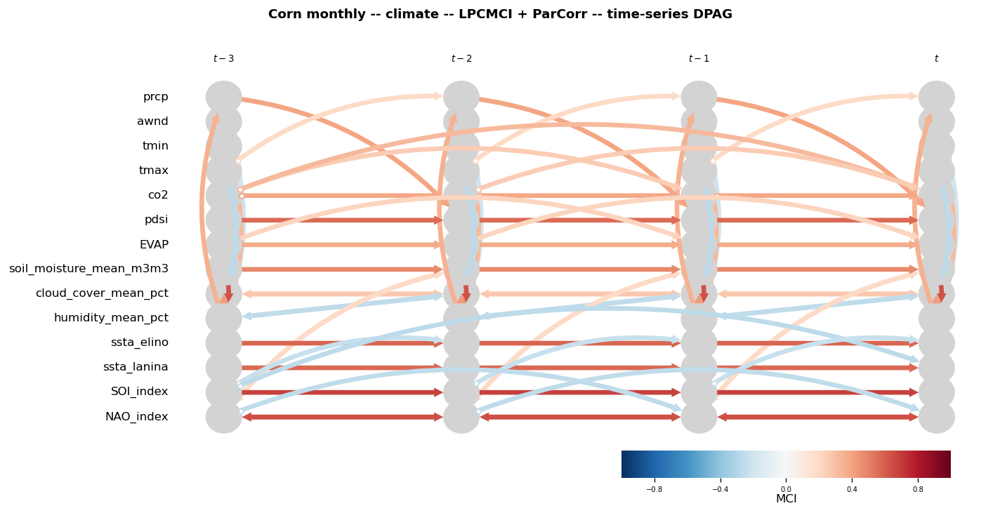


  -- climate_rv (15 vars) --  elapsed: 1.4s

  -- DPAG edges: 18  {'confounded': 10, 'directed': 5, 'uncertain-directed': 3} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.815  0.000
                   prcp                    pdsi    0         confounded    0.412  0.000
                   prcp                    awnd    0         confounded    0.382  0.000
                   tmin       humidity_mean_pct    0         confounded    0.326  0.000
                   pdsi soil_moisture_mean_m3m3    0         confounded    0.269  0.008
                   tmax soil_moisture_mean_m3m3    0         confounded   -0.265  0.008
                   tmax                    pdsi    0         confounded   -0.253  0.014
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.251  0.015
                   awnd       humidity_mean_pct    0         confounded   -0.20

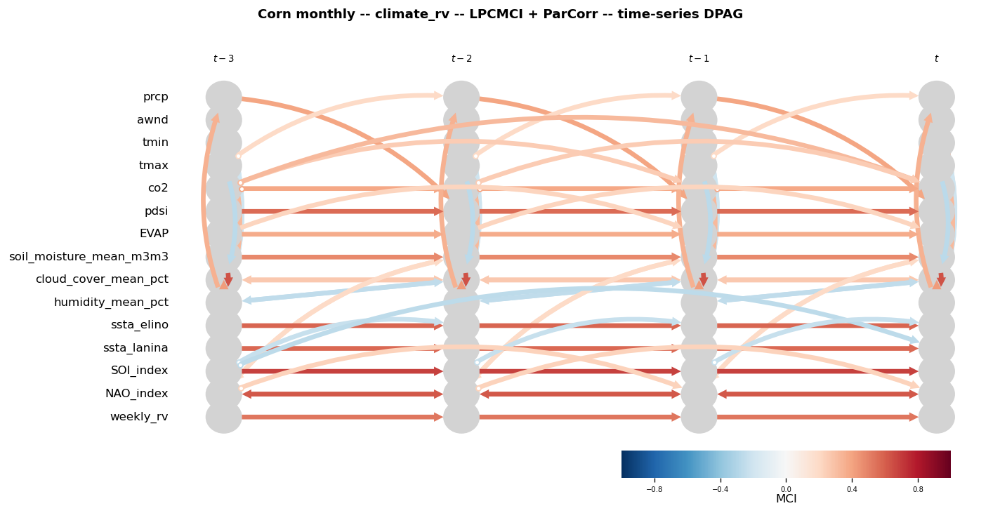


  -- macro_climate_rv (19 vars) --  elapsed: 2.3s

  -- DPAG edges: 22  {'confounded': 12, 'directed': 6, 'uncertain-directed': 4} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.808  0.000
                   prcp                    pdsi    0         confounded    0.412  0.000
                   prcp                    awnd    0         confounded    0.376  0.000
                   tmin       humidity_mean_pct    0         confounded    0.326  0.000
                   pdsi soil_moisture_mean_m3m3    0         confounded    0.269  0.011
                   tmax soil_moisture_mean_m3m3    0         confounded   -0.265  0.012
                   tmax                    pdsi    0         confounded   -0.253  0.020
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.251  0.022
             DJIA_Index      Broad_Dollar_index    0         confounded  

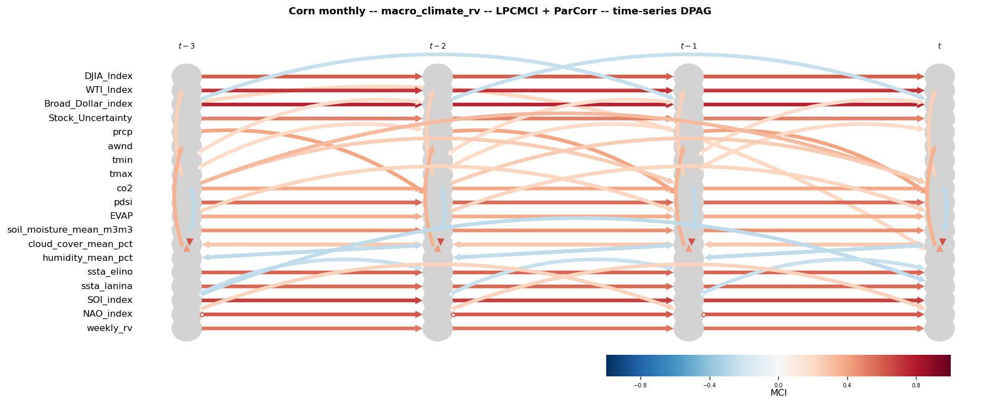


  -- macro_news_climate_rv (22 vars) --  elapsed: 3.2s

  -- DPAG edges: 25  {'confounded': 11, 'directed': 10, 'uncertain-directed': 4} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.808  0.000
                   prcp                    pdsi    0         confounded    0.412  0.000
                   prcp                    awnd    0         confounded    0.376  0.000
                   tmin       humidity_mean_pct    0         confounded    0.326  0.000
                   pdsi soil_moisture_mean_m3m3    0         confounded    0.269  0.012
                   tmax soil_moisture_mean_m3m3    0         confounded   -0.265  0.013
                   tmax                    pdsi    0         confounded   -0.253  0.022
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.251  0.024
             DJIA_Index      Broad_Dollar_index    0         confou

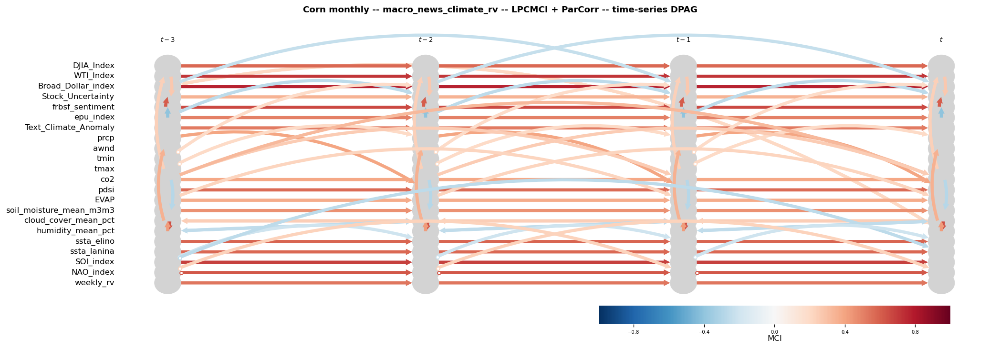


######################################################################
  CROP: SOYBEAN  |  FREQUENCY: MONTHLY
######################################################################
  Preprocessed: (192, 22)  (2009-04-01 -> 2025-03-01)
  -- climate (reusing shared result) --

  -- climate_rv (15 vars) --  elapsed: 1.4s

  -- DPAG edges: 18  {'confounded': 10, 'directed': 6, 'uncertain-directed': 2} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.812  0.000
                   prcp                    awnd    0         confounded    0.395  0.000
                   prcp                    pdsi    0         confounded    0.357  0.000
                   tmin       humidity_mean_pct    0         confounded    0.329  0.000
                   tmax soil_moisture_mean_m3m3    0         confounded   -0.272  0.006
                   tmax                    pdsi    0         confou

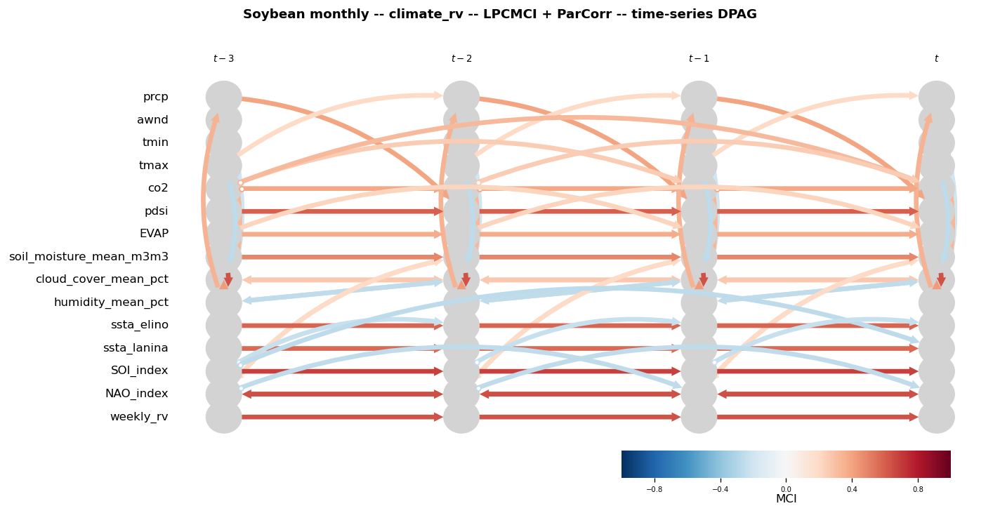


  -- macro_climate_rv (19 vars) --  elapsed: 2.2s

  -- DPAG edges: 22  {'confounded': 12, 'directed': 7, 'uncertain-directed': 3} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.812  0.000
                   prcp                    awnd    0         confounded    0.388  0.000
                   prcp                    pdsi    0         confounded    0.357  0.000
                   tmin       humidity_mean_pct    0         confounded    0.329  0.000
                   tmax soil_moisture_mean_m3m3    0         confounded   -0.272  0.009
                   tmax                    pdsi    0         confounded   -0.259  0.016
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.251  0.022
             DJIA_Index      Broad_Dollar_index    0         confounded   -0.227  0.067
                   pdsi soil_moisture_mean_m3m3    0         confounded  

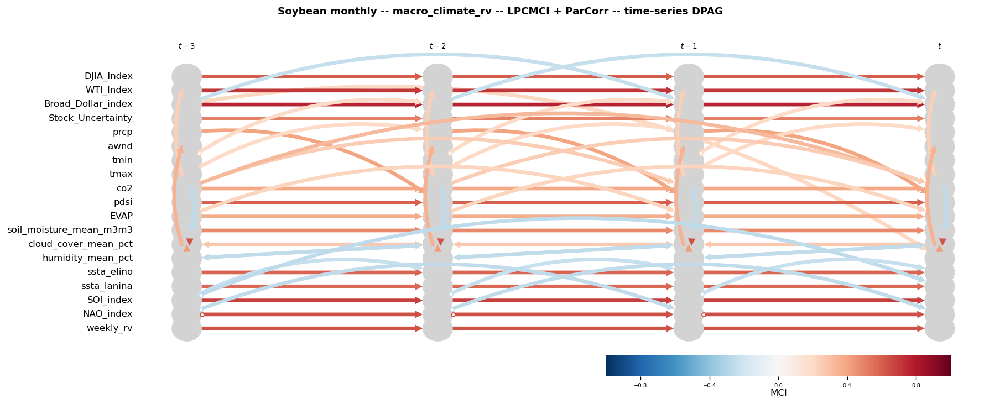


  -- macro_news_climate_rv (22 vars) --  elapsed: 3.1s

  -- DPAG edges: 25  {'confounded': 11, 'directed': 11, 'uncertain-directed': 3} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.812  0.000
                   prcp                    awnd    0         confounded    0.388  0.000
                   prcp                    pdsi    0         confounded    0.357  0.000
                   tmin       humidity_mean_pct    0         confounded    0.329  0.000
                   tmax soil_moisture_mean_m3m3    0         confounded   -0.272  0.009
                   tmax                    pdsi    0         confounded   -0.259  0.018
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.251  0.024
             DJIA_Index      Broad_Dollar_index    0         confounded   -0.227  0.076
                   pdsi soil_moisture_mean_m3m3    0         confou

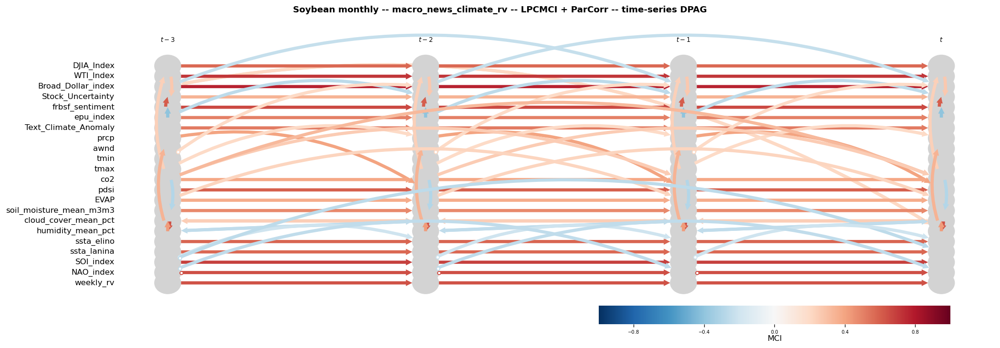


######################################################################
  CROP: WHEAT  |  FREQUENCY: MONTHLY
######################################################################
  Preprocessed: (192, 22)  (2009-04-01 -> 2025-03-01)
  -- climate (reusing shared result) --

  -- climate_rv (15 vars) --  elapsed: 1.4s

  -- DPAG edges: 16  {'confounded': 7, 'directed': 5, 'uncertain-directed': 4} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.812  0.000
                   tmax    cloud_cover_mean_pct    0         confounded   -0.275  0.006
                   tmin       humidity_mean_pct    0         confounded    0.256  0.014
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.251  0.017
                   tmax                    pdsi    1         confounded   -0.201  0.156
            ssta_lanina                    awnd    2         confounde

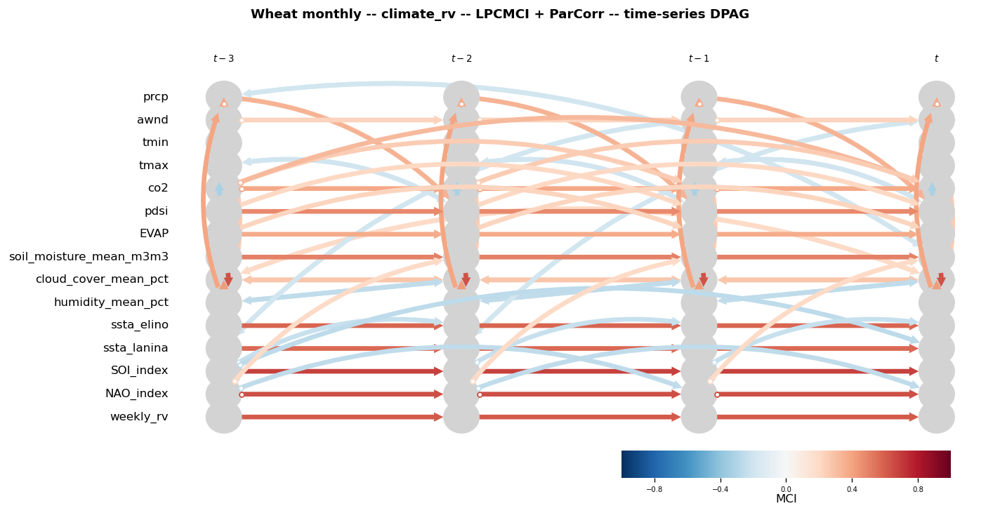


  -- macro_climate_rv (19 vars) --  elapsed: 2.4s

  -- DPAG edges: 22  {'confounded': 11, 'directed': 6, 'uncertain-directed': 5} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.812  0.000
                   tmax    cloud_cover_mean_pct    0         confounded   -0.275  0.008
                   tmin       humidity_mean_pct    0         confounded    0.256  0.020
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.251  0.024
             DJIA_Index      Broad_Dollar_index    0         confounded   -0.224  0.076
                   tmin      Broad_Dollar_index    1         confounded    0.221  0.084
     Broad_Dollar_index       humidity_mean_pct    3         confounded    0.208  0.137
                   prcp      Broad_Dollar_index    2         confounded    0.202  0.186
                   tmax                    pdsi    1         confounded  

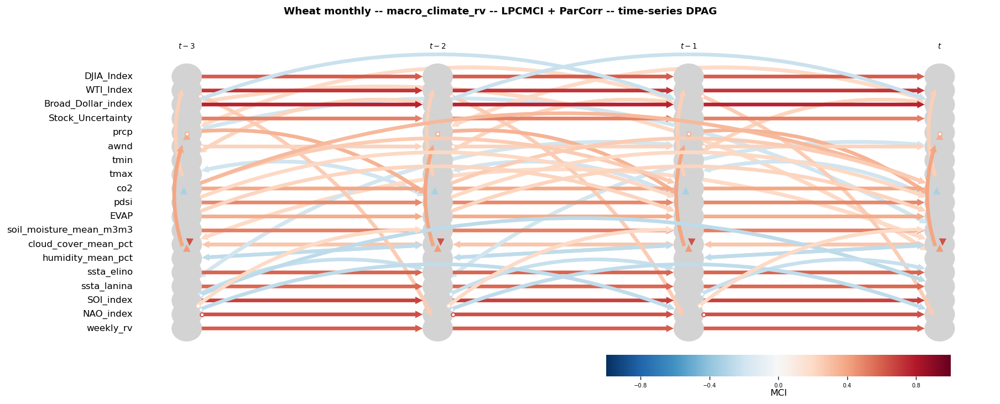


  -- macro_news_climate_rv (22 vars) --  elapsed: 3.4s

  -- DPAG edges: 25  {'confounded': 11, 'directed': 10, 'uncertain-directed': 4} --
                  cause                  effect  lag           category  mci_val  q_val
                   tmin                    tmax    0         confounded    0.812  0.000
                   tmax    cloud_cover_mean_pct    0         confounded   -0.275  0.009
                   tmin       humidity_mean_pct    0         confounded    0.256  0.021
      humidity_mean_pct    cloud_cover_mean_pct    1         confounded   -0.250  0.027
             DJIA_Index      Broad_Dollar_index    0         confounded   -0.224  0.085
                   tmin      Broad_Dollar_index    1         confounded    0.221  0.094
     Broad_Dollar_index       humidity_mean_pct    3         confounded    0.208  0.155
                   prcp      Broad_Dollar_index    2         confounded    0.202  0.208
                   tmax                    pdsi    1         confou

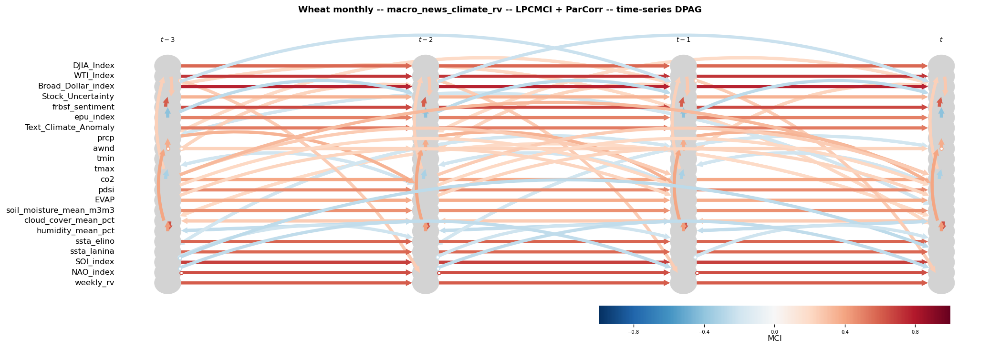


All runs done.


In [10]:
all_results: dict[str, dict] = {}
climate_result: dict | None = None  # climate is crop-agnostic -- run once, reuse

for crop in CROPS:
    sep = '#' * 70
    print(f'\n{sep}')
    print(f'  CROP: {crop.upper()}  |  FREQUENCY: {FREQUENCY.upper()}')
    print(sep)

    arr_normal, all_cols, dates = load_and_preprocess(crop, FREQUENCY)
    print(f'  Preprocessed: {arr_normal.shape}  '
          f'({dates.min().date()} -> {dates.max().date()})')

    all_results[crop] = {}

    for fs_name, groups in FEATURE_SETS.items():
        if fs_name == 'climate' and climate_result is not None:
            all_results[crop][fs_name] = climate_result
            print('  -- climate (reusing shared result) --')
            continue

        col_names = [c for c in build_cols(groups) if c in all_cols]

        t0  = time.time()
        res = run_lpcmci(
            col_names=col_names,
            arr_preprocessed=arr_normal,
            all_cols=all_cols,
            tau_max=TAU_MAX,
        )
        elapsed = time.time() - t0

        if fs_name == 'climate':
            climate_result = res

        all_results[crop][fs_name] = res

        print(f'\n  -- {fs_name} ({len(col_names)} vars) --  elapsed: {elapsed:.1f}s')
        log_links(res)
        plot_results(res, title=f'{crop.capitalize()} {FREQUENCY} -- {fs_name} -- LPCMCI + {METHOD_LABEL}')

print('\nAll runs done.')

## Cross-Crop Comparison: Causal vs Confounded Links into `weekly_rv`

For each RV feature set, every edge touching `weekly_rv` — whether a directed candidate cause or a
`<->` confounded pairing that PCMCI would have missed entirely (it can only report `-->` or `o-o`).

In [11]:
for fs_name in ['climate_rv', 'macro_climate_rv', 'macro_news_climate_rv']:
    print(f'\n{"="*70}')
    print(f'  Feature set: {fs_name}')
    print(f'{"="*70}')
    for crop in CROPS:
        links = extract_rv_links(all_results[crop][fs_name])
        print(f'\n  {crop.upper()}:')
        if links.empty:
            print('    No edges touching weekly_rv.')
        else:
            print(links.sort_values('category').to_string(index=False,
                  float_format='{:.3f}'.format, col_space=16))


  Feature set: climate_rv

  CORN:
    No edges touching weekly_rv.

  SOYBEAN:
    No edges touching weekly_rv.

  WHEAT:
    No edges touching weekly_rv.

  Feature set: macro_climate_rv

  CORN:
    No edges touching weekly_rv.

  SOYBEAN:
    No edges touching weekly_rv.

  WHEAT:
           cause           effect              lag           category          mci_val            q_val
       WTI_Index        weekly_rv                1 uncertain-directed            0.251            0.024

  Feature set: macro_news_climate_rv

  CORN:
    No edges touching weekly_rv.

  SOYBEAN:
    No edges touching weekly_rv.

  WHEAT:
           cause           effect              lag           category          mci_val            q_val
       WTI_Index        weekly_rv                1 uncertain-directed            0.251            0.025


## LPCMCI vs PCMCI+ParCorr — Does Latent-Confounder-Robust Analysis Change the Story?

Re-runs plain `PCMCI.run_pcmci` + ParCorr (`pcmci_parcorr.ipynb`'s settings: `pc_alpha=0.2`, `alpha_level=0.05`, `fdr_bh`)
on the `climate_rv` feature set and checks, for every parent PCMCI found for `weekly_rv`, what LPCMCI
concluded about that same pair. A link PCMCI calls significant but LPCMCI marks `<->` is a link that
should **not** be interpreted causally — it is exactly the kind of false positive causal sufficiency
produces.

In [12]:
def run_pcmci_baseline(col_names, arr_preprocessed, all_cols, tau_max,
                        pc_alpha=0.2, alpha_level=0.05, fdr_method='fdr_bh'):
    indices     = [all_cols.index(c) for c in col_names]
    data_subset = arr_preprocessed[:, indices]
    dataframe = pp.DataFrame(data_subset, var_names=col_names, datatime={0: np.arange(len(data_subset))})
    parcorr = ParCorr(significance='analytic')
    pcmci   = PCMCI(dataframe=dataframe, cond_ind_test=parcorr, verbosity=0)
    results = pcmci.run_pcmci(tau_min=1, tau_max=tau_max, pc_alpha=pc_alpha,
                               alpha_level=alpha_level, fdr_method=fdr_method)
    q_matrix = pcmci.get_corrected_pvalues(p_matrix=results['p_matrix'], tau_max=tau_max, fdr_method=fdr_method)
    graph    = pcmci.get_graph_from_pmatrix(p_matrix=q_matrix, alpha_level=alpha_level, tau_min=1, tau_max=tau_max)
    return {'graph': graph, 'val_matrix': results['val_matrix'], 'q_matrix': q_matrix, 'col_names': col_names}


print(f'{"Crop":<10} {"Cause":<24} {"Lag":<4} {"PCMCI+ParCorr":<16} {"LPCMCI verdict":<32}')
print('-' * 88)

for crop in CROPS:
    arr_normal, all_cols, _ = load_and_preprocess(crop, FREQUENCY)
    col_names = [c for c in build_cols(FEATURE_SETS['climate_rv']) if c in all_cols]
    pc_res = run_pcmci_baseline(col_names, arr_normal, all_cols, tau_max=BASELINE_TAU_MAX)

    rv_idx = col_names.index('weekly_rv')
    pcmci_parents = [
        (col_names[i], tau) for i in range(len(col_names))
        for tau in range(1, BASELINE_TAU_MAX + 1)
        if i != rv_idx and pc_res['graph'][i, rv_idx, tau] not in ('', 'o-o')
    ]

    lp_df = extract_rv_links(all_results[crop]['climate_rv'])
    lp_into_rv    = lp_df[lp_df['effect'] == 'weekly_rv'] if not lp_df.empty else pd.DataFrame()
    lp_confounded = set(
        frozenset((r['cause'], r['effect'])) for _, r in lp_df.iterrows() if r['category'] == 'confounded'
    ) if not lp_df.empty else set()

    if not pcmci_parents:
        print(f'{crop:<10} (no significant PCMCI+ParCorr parents of weekly_rv)')
        continue

    for cause, tau in pcmci_parents:
        if frozenset((cause, 'weekly_rv')) in lp_confounded:
            verdict = 'DOWNGRADED -> confounded (<->)'
        else:
            match = lp_into_rv[(lp_into_rv['cause'] == cause) & (lp_into_rv['lag'] == tau)] if not lp_into_rv.empty else pd.DataFrame()
            verdict = f"confirmed: {match.iloc[0]['category']}" if not match.empty else 'not recovered by LPCMCI'
        print(f'{crop:<10} {cause:<24} {tau:<4} {"significant":<16} {verdict:<32}')

Crop       Cause                    Lag  PCMCI+ParCorr    LPCMCI verdict                  
----------------------------------------------------------------------------------------
corn       (no significant PCMCI+ParCorr parents of weekly_rv)
soybean    (no significant PCMCI+ParCorr parents of weekly_rv)
wheat      (no significant PCMCI+ParCorr parents of weekly_rv)


## Summary

**Preprocessing (identical to `eda_preprocessing.ipynb` and every other notebook in this project):**
- Interpolate `pdsi`, `Broad_Dollar_index` | ffill `DJIA_Index`
- `pp.smooth(smooth_width=180, kernel='gaussian', residuals=True)` — 15-yr Gaussian detrend
- Phase-wise anomalization (`cycle_length=12`)
- `pp.trafo2normal` — rank-based Gaussianisation

**LPCMCI + ParCorr config:** `tau_min=0`, `tau_max=3`, `pc_alpha=0.01`, `n_preliminary_iterations=1`,
`max_p_global=2`, `max_p_non_ancestral=1`, `max_q_global=2` — runtime bounds that trade LPCMCI's
asymptotic completeness for tractability at N up to 22 (see Runtime Tuning above).

**Interpreting the DPAG:**
- `-->` : candidate cause, not reverse-causal — still only a *candidate*: it can coexist with
  additional unobserved confounding unless "visible" (tutorial S1.2.1)
- `<->` : **not causal** — both variables are driven by something outside the dataset
- `o->` / `o-o` : orientation undetermined at this `pc_alpha` / `tau_max`

**Next steps:** widen `max_p_non_ancestral` for a slower but more complete run; cross-check `<->`
edges into `weekly_rv` against candidate omitted variables (e.g. global risk sentiment indices) not
currently in `FEATURE_GROUPS`; compare against `lpcmci_gpdc.ipynb` / `lpcmci_cmi.ipynb` to see whether
the confounder-vs-cause classification is robust to the choice of CI test.